# Importing Our Libraries

In [137]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from datetime import datetime
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans
import folium
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.metrics import v_measure_score
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from yellowbrick.cluster import KElbowVisualizer

In [95]:
uber = pd.read_csv('/Users/alix/Desktop/uber-raw-data-jul14.csv', index_col=None)
uber

,Date/Time,Lat,Lon,Base
0,7/1/2014 0:03:00,40.7586,-73.9706,B02512
1,7/1/2014 0:05:00,40.7605,-73.9994,B02512
2,7/1/2014 0:06:00,40.7320,-73.9999,B02512
3,7/1/2014 0:09:00,40.7635,-73.9793,B02512
4,7/1/2014 0:20:00,40.7204,-74.0047,B02512
...,...,...,...,...
796116,7/31/2014 23:22:00,40.7285,-73.9846,B02764
796117,7/31/2014 23:23:00,40.7615,-73.9868,B02764
796118,7/31/2014 23:29:00,40.6770,-73.9515,B02764
796119,7/31/2014 23:30:00,40.7225,-74.0038,B02764


# 1 Clean Data Set the Date 

In [121]:
uber.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 796121 entries, 0 to 796120
Data columns (total 4 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   Date/Time  796121 non-null  object 
 1   Lat        796121 non-null  float64
 2   Lon        796121 non-null  float64
 3   Base       796121 non-null  object 
dtypes: float64(2), object(2)
memory usage: 24.3+ MB


# Sampling /0.01 (of the total july count)








In [97]:
#Take a 0.01 sample from the dataset
uber_sample = uber.sample(n=None, frac=0.01, replace=False, weights=None, random_state=None, axis=None)


# Set up the Date

In [98]:
# Set the Date and time to Datetime
uber_sample['Date/Time']=pd.to_datetime(uber['Date/Time'], format='%m/%d/%Y %H:%M:%S')

In [99]:

uber_sample['Hour'] = uber_sample['Date/Time'].dt.hour
uber_sample['Month'] = uber_sample['Date/Time'].dt.month
uber_sample['Day'] = uber_sample['Date/Time'].dt.day
uber_sample['Weekday']=uber_sample['Date/Time'].dt.day_name()
uber_sample.head()


,Date/Time,Lat,Lon,Base,Hour,Month,Day,Weekday
329402,2014-07-08 19:17:00,40.7173,-73.9553,B02617,19,7,8,Tuesday
422750,2014-07-17 17:14:00,40.6415,-73.7882,B02617,17,7,17,Thursday
738931,2014-07-24 16:52:00,40.7407,-73.9918,B02682,16,7,24,Thursday
607600,2014-07-03 16:49:00,40.7362,-73.9828,B02682,16,7,3,Thursday
297930,2014-07-03 10:04:00,40.7591,-73.9962,B02617,10,7,3,Thursday


In [100]:
uber_sample.drop(['Base'], axis=1)

,Date/Time,Lat,Lon,Hour,Month,Day,Weekday
329402,2014-07-08 19:17:00,40.7173,-73.9553,19,7,8,Tuesday
422750,2014-07-17 17:14:00,40.6415,-73.7882,17,7,17,Thursday
738931,2014-07-24 16:52:00,40.7407,-73.9918,16,7,24,Thursday
607600,2014-07-03 16:49:00,40.7362,-73.9828,16,7,3,Thursday
297930,2014-07-03 10:04:00,40.7591,-73.9962,10,7,3,Thursday
...,...,...,...,...,...,...,...
27297,2014-07-25 17:16:00,40.7457,-74.0012,17,7,25,Friday
213563,2014-07-24 04:21:00,40.7710,-73.9575,4,7,24,Thursday
293314,2014-07-02 18:29:00,40.7524,-73.9930,18,7,2,Wednesday
292262,2014-07-02 17:16:00,40.6448,-73.7818,17,7,2,Wednesday


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


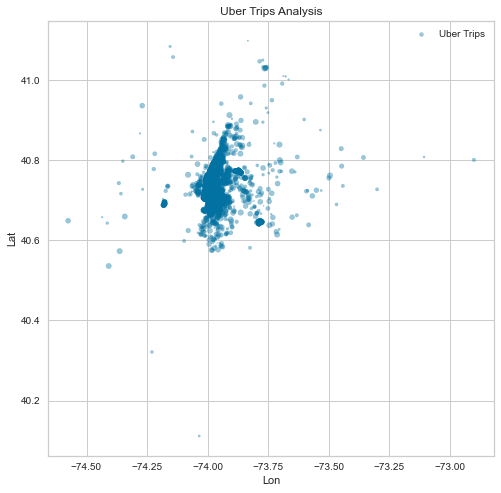

In [101]:
uber_sample.plot(kind='scatter', x='Lon', y='Lat', alpha=0.4, s=uber_sample['Day'], label='Uber Trips',
figsize=(8, 8), cmap=plt.get_cmap('jet'))
plt.title("Uber Trips Analysis")
plt.legend()
plt.show()

Text(0.5, 1.0, 'Frequency of use by day')

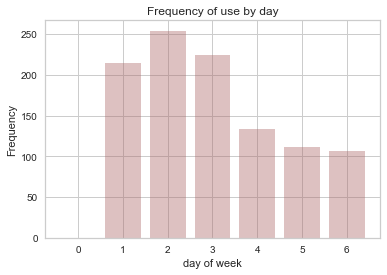

In [102]:
plt.hist(uber_sample.Day, bins = 7, range= (-.5, 6.5), rwidth = .8, color = '#AA6666', alpha= .4)
xticks=(range(7), 'Mon, Tue, Thu, Wed, Fri, Sat, Sun'.split())
plt.xlabel('day of week')
plt.ylabel('Frequency')
plt.title('Frequency of use by day')

<AxesSubplot:>

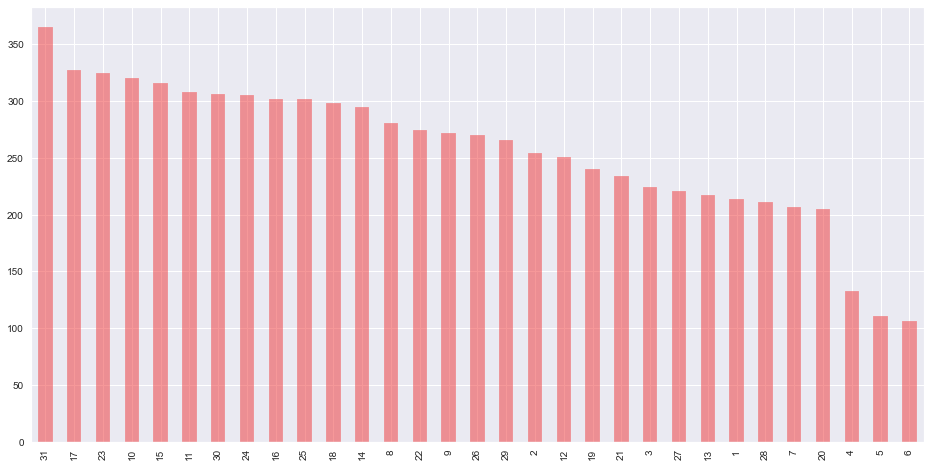

In [151]:
uber_sample['Day'].value_counts().plot(kind='bar',figsize=(16,8),color='#EE3335', alpha= .5)

In [152]:
uber_sample['Date/Time']=pd.to_datetime(uber['Date/Time'], format='%m/%d/%Y %H:%M:%S')
uber_sample

,Date/Time,Lat,Lon,Base,Hour,Month,Day,Weekday,labels_kmeans,dbscan_label,labels_agg,dom
329402,2014-07-08 19:17:00,40.7173,-73.9553,B02617,19,7,8,Tuesday,4,0,0,8
422750,2014-07-17 17:14:00,40.6415,-73.7882,B02617,17,7,17,Thursday,2,1,1,17
738931,2014-07-24 16:52:00,40.7407,-73.9918,B02682,16,7,24,Thursday,1,0,0,24
607600,2014-07-03 16:49:00,40.7362,-73.9828,B02682,16,7,3,Thursday,1,0,0,3
297930,2014-07-03 10:04:00,40.7591,-73.9962,B02617,10,7,3,Thursday,6,0,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...
27297,2014-07-25 17:16:00,40.7457,-74.0012,B02512,17,7,25,Friday,1,0,0,25
213563,2014-07-24 04:21:00,40.7710,-73.9575,B02598,4,7,24,Thursday,6,0,2,24
293314,2014-07-02 18:29:00,40.7524,-73.9930,B02617,18,7,2,Wednesday,1,0,0,2
292262,2014-07-02 17:16:00,40.6448,-73.7818,B02617,17,7,2,Wednesday,2,1,1,2


In [153]:
def get_dom(dt):
    return dt.day
uber_sample['dom'] = uber_sample['Date/Time'].map(get_dom)
    

In [154]:
def count_rows(rows):
    return len(rows)

by_date = uber_sample.groupby('dom').apply(count_rows)
by_date

dom
1     214
2     254
3     224
4     133
5     111
6     106
7     207
8     281
9     272
10    320
11    308
12    251
13    217
14    295
15    316
16    302
17    327
18    298
19    240
20    205
21    234
22    275
23    325
24    305
25    302
26    270
27    221
28    211
29    266
30    306
31    365
dtype: int64

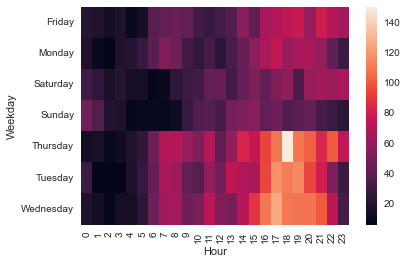

In [160]:
hm= sns.heatmap(by_cross) 






# 2. Kmeans

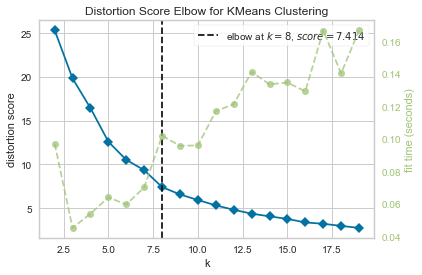

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [105]:
x = uber_sample[['Lat', 'Lon']]
model = KMeans()
visualizer = KElbowVisualizer(estimator = model, k = (2,20))
visualizer.fit(x)
visualizer.poof()


In [106]:
uber_sample

,Date/Time,Lat,Lon,Base,Hour,Month,Day,Weekday
329402,2014-07-08 19:17:00,40.7173,-73.9553,B02617,19,7,8,Tuesday
422750,2014-07-17 17:14:00,40.6415,-73.7882,B02617,17,7,17,Thursday
738931,2014-07-24 16:52:00,40.7407,-73.9918,B02682,16,7,24,Thursday
607600,2014-07-03 16:49:00,40.7362,-73.9828,B02682,16,7,3,Thursday
297930,2014-07-03 10:04:00,40.7591,-73.9962,B02617,10,7,3,Thursday
...,...,...,...,...,...,...,...,...
27297,2014-07-25 17:16:00,40.7457,-74.0012,B02512,17,7,25,Friday
213563,2014-07-24 04:21:00,40.7710,-73.9575,B02598,4,7,24,Thursday
293314,2014-07-02 18:29:00,40.7524,-73.9930,B02617,18,7,2,Wednesday
292262,2014-07-02 17:16:00,40.6448,-73.7818,B02617,17,7,2,Wednesday


In [107]:


model = KMeans (n_clusters=7)
Y_kmeans = model.fit_predict(x)

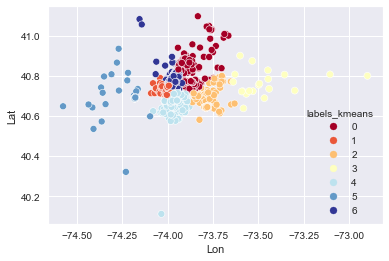

In [108]:
uber_sample['labels_kmeans'] = model.labels_

sns.set_style('darkgrid')
sns.scatterplot(data=uber_sample, x='Lon', y='Lat', hue='labels_kmeans', palette='RdYlBu')
plt.show()


#uber_map_list_cluster1 = uber_sample[['Lat','Lon']][uber_sample['labels_kmeans']==0].values.tolist()
#uber_map_list_cluster2 = uber_sample[['Lat','Lon']][uber_sample['labels_kmeans']==1].values.tolist()
#uber_map_list_cluster3 = uber_sample[['Lat','Lon']][uber_sample['labels_kmeans']==2].values.tolist()
#uber_map_list_cluster4 = uber_sample[['Lat','Lon']][uber_sample['labels_kmeans']==3].values.tolist()
#uber_map_list_cluster5 = uber_sample[['Lat','Lon']][uber_sample['labels_kmeans']==4].values.tolist()
#uber_map_list_cluster6 = uber_sample[['Lat','Lon']][uber_sample['labels_kmeans']==5].values.tolist()
#uber_map_list_cluster7 = uber_sample[['Lat','Lon']][uber_sample['labels_kmeans']==6].values.tolist()
#size_map_list_1 = len(uber_map_list_cluster1)
#size_map_list_2 = len(uber_map_list_cluster2)
#size_map_list_3 = len(uber_map_list_cluster)size_map_list_4 = len(uber_map_list_cluster4)
##size_map_list_5 = len(uber_map_list_cluster5)
#size_map_list_6 = len(uber_map_list_cluster6)
#size_map_list_7 = len(uber_map_list_cluster7)

m_p= folium.Map(location=[40.7128, -74.0060], zoom_start=10,tiles = "openstreetmap")

for point in range(0,size_map_list_1):
    folium.CircleMarker(data_map_list_cluster1[point], radius=2,color='blue',fill_color='lightblue',).add_to(m_p)
for point in range(0,size_map_list_2):
    folium.CircleMarker(data_map_list_cluster2[point], radius=2,color='green',fill_color='lightgreen',).add_to(m_p)
for point in range(0,size_map_list_3):
    folium.CircleMarker(data_map_list_cluster3[point], radius=2,color='purple',fill_color='purple',).add_to(m_p)
for point in range(0,size_map_list_4):
    folium.CircleMarker(data_map_list_cluster4[point], radius=2,color='orange',fill_color='orange',).add_to(m_p)
for point in range(0,size_map_list_5):
    folium.CircleMarker(data_map_list_cluster5[point], radius=2,color='red',fill_color='red',).add_to(m_p)
for point in range(0,size_map_list_6):
    folium.CircleMarker(data_map_list_cluster6[point], radius=2,color='violet',fill_color='violet',).add_to(m_p)
for point in range(0,size_map_list_7):
    folium.CircleMarker(data_map_list_cluster7[point], radius=2,color='brown',fill_color='brown',).add_to(m_p)

m_p

# 3 DBSCAN 

In [110]:
dbscan = DBSCAN(eps=0.009, min_samples=20,n_jobs=-1)
dbscan.fit(x)
y_dbscan = dbscan.fit_predict(x)
y_dbscan’

array([0, 1, 0, ..., 0, 1, 0])

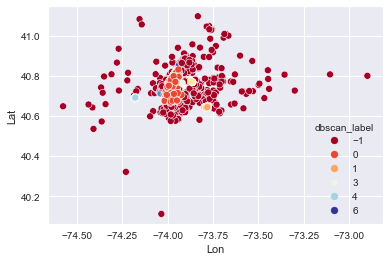

In [111]:
uber_sample['dbscan_label'] =dbscan.labels_

sns.set_style('darkgrid')
sns.scatterplot(data=uber_sample, x='Lon', y='Lat', hue='dbscan_label', palette='RdYlBu')
plt.show()

In [158]:
uber_map_list_cluster1 = uber_sample[['Lat','Lon']][uber_sample['dbscan_label']==0].values.tolist()
uber_map_list_cluster2 = uber_sample[['Lat','Lon']][uber_sample['dbscan_label']==1].values.tolist()
uber_map_list_cluster3 = uber_sample[['Lat','Lon']][uber_sample['dbscan_label']==2].values.tolist()
uber_map_list_cluster4 = uber_sample[['Lat','Lon']][uber_sample['dbscan_label']==3].values.tolist()
uber_map_list_cluster5 = uber_sample[['Lat','Lon']][uber_sample['dbscan_label']==4].values.tolist()
uber_map_list_cluster6 = uber_sample[['Lat','Lon']][uber_sample['dbscan_label']==5].values.tolist()
uber_map_list_cluster_1 = uber_sample[['Lat','Lon']][uber_sample['dbscan_label']==-1].values.tolist()
size_map_list_1 = len(uber_map_list_cluster1)
size_map_list_2 = len(uber_map_list_cluster2)
size_map_list_3 = len(uber_map_list_cluster3)
size_map_list_4 = len(uber_map_list_cluster4)
size_map_list_5 = len(uber_map_list_cluster5)
size_map_list_6 = len(uber_map_list_cluster6)
size_map_list__1 = len(uber_map_list_cluster_1)

In [159]:
m_p= folium.Map(location=[40.7128, -74.0060], zoom_start=10,tiles = "openstreetmap")

for point in range(0,size_map_list_1):
    folium.CircleMarker(uber_map_list_cluster1[point], radius=2,color='blue',fill_color='lightblue',).add_to(m_p)
for point in range(0,size_map_list_2):
    folium.CircleMarker(uber_map_list_cluster2[point], radius=2,color='green',fill_color='lightgreen',).add_to(m_p)
for point in range(0,size_map_list_3):
    folium.CircleMarker(uber_map_list_cluster3[point], radius=2,color='purple',fill_color='purple',).add_to(m_p)
for point in range(0,size_map_list_4):
    folium.CircleMarker(uber_map_list_cluster4[point], radius=2,color='orange',fill_color='orange',).add_to(m_p)
for point in range(0,size_map_list_5):
    folium.CircleMarker(uber_map_list_cluster5[point], radius=2,color='red',fill_color='red',).add_to(m_p)
for point in range(0,size_map_list_6):
    folium.CircleMarker(uber_map_list_cluster6[point], radius=2,color='violet',fill_color='violet',).add_to(m_p)
for point in range(0,size_map_list__1):
    folium.CircleMarker(uber_map_list_cluster_1[point], radius=2,color='brown',fill_color='brown',).add_to(m_p)

m_p

## 4 Agglomerative Clustering

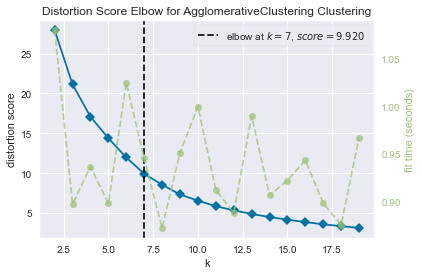

<AxesSubplot:title={'center':'Distortion Score Elbow for AgglomerativeClustering Clustering'}, xlabel='k', ylabel='distortion score'>

In [112]:
from sklearn.cluster import AgglomerativeClustering
model = AgglomerativeClustering()
visualizer = KElbowVisualizer(estimator = model, k = (2,20))
visualizer.fit(x)
visualizer.poof()

In [113]:
cluster = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='ward')  
y_agg=cluster.fit_predict(x)

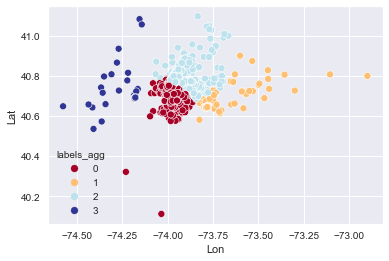

In [114]:
uber_sample['labels_agg'] = cluster.labels_

sns.set_style('darkgrid')
sns.scatterplot(data=uber_sample, x='Lon', y='Lat', hue='labels_agg', palette='RdYlBu')
plt.show()

In [115]:
uber_map_list_cluster1 = uber_sample[['Lat','Lon']][uber_sample['labels_agg']==0].values.tolist()
uber_map_list_cluster2 = uber_sample[['Lat','Lon']][uber_sample['labels_agg']==1].values.tolist()
uber_map_list_cluster3 = uber_sample[['Lat','Lon']][uber_sample['labels_agg']==2].values.tolist()
uber_map_list_cluster4 = uber_sample[['Lat','Lon']][uber_sample['labels_agg']==3].values.tolist()
size_map_list_1 = len(uber_map_list_cluster1)
size_map_list_2 = len(uber_map_list_cluster2)
size_map_list_3 = len(uber_map_list_cluster3)
size_map_list_4 = len(uber_map_list_cluster4)

In [161]:
m_p= folium.Map(location=[40.7128, -74.0060], zoom_start=10,tiles = "openstreetmap")

for point in range(0,size_map_list_1):
    folium.CircleMarker(uber_map_list_cluster1[point], radius=2,color='blue',fill_color='lightblue',).add_to(m_p)
for point in range(0,size_map_list_2):
    folium.CircleMarker(uber_map_list_cluster2[point], radius=2,color='green',fill_color='lightgreen',).add_to(m_p)
for point in range(0,size_map_list_3):
    folium.CircleMarker(uber_map_list_cluster3[point], radius=2,color='purple',fill_color='purple',).add_to(m_p)
for point in range(0,size_map_list_4):
    folium.CircleMarker(uber_map_list_cluster4[point], radius=2,color='orange',fill_color='orange',).add_to(m_p)

m_p

In [117]:
uber_sample.to_csv(r'/Users/alix/Desktop/uber.csv')

In [ ]:
`